In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
pd.options.plotting.backend = "plotly"
import seaborn as sns
from sklearn import preprocessing
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
train_set = pd.read_pickle('./TRAIN_TO_MODEL_20211122.pkl')
train_set.head()

,T_Lam_9,MG_NIR_Salida_Ext,Conc_P3-11,TT-35-GO,Humedad_Semilla,T_Mat_entrada,T_Solvente,Q_Solvente,Ritmo_Molienda,Q_Miscela,Vel_Extractor,Conc_Miscela,Solvente_NIR_Salida_Ext,LT-17,TT-35-GI
Time,,,,,,,,,,,,,,,
2021-10-07 15:00:00,0.086037,0.725236,0.02962,0.108910,0.535927,0.324199,0.443770,0.325677,0.331733,0.281030,0.32854,0.311833,0.605151,0.506014,0.269314
2021-10-07 15:03:00,0.089563,0.726583,0.02962,0.102093,0.535927,0.339890,0.315456,0.306750,0.331688,0.280487,0.32703,0.317644,0.590560,0.497188,0.280501
2021-10-07 15:06:00,0.093035,0.826301,0.02962,0.078385,0.534676,0.384396,0.317246,0.333205,0.331782,0.279866,0.32703,0.324486,0.583732,0.499690,0.269373
2021-10-07 15:09:00,0.096127,0.783242,0.02962,0.078234,0.535179,0.441838,0.293988,0.316776,0.332166,0.279961,0.32703,0.327874,0.585881,0.511257,0.276312
2021-10-07 15:12:00,0.098893,0.785093,0.02962,0.077646,0.535927,0.459862,0.530917,0.309547,0.332959,0.280146,0.32703,0.328106,0.611346,0.532276,0.279130


In [3]:
train_set.plot()

In [4]:
test_set = pd.read_pickle('./TEST_TO_MODEL_20211122.pkl')
test_set.head()

,T_Lam_9,MG_NIR_Salida_Ext,Conc_P3-11,TT-35-GO,Humedad_Semilla,T_Mat_entrada,T_Solvente,Q_Solvente,Ritmo_Molienda,Q_Miscela,Vel_Extractor,Conc_Miscela,Solvente_NIR_Salida_Ext,LT-17,TT-35-GI
Time,,,,,,,,,,,,,,,
2021-10-29 15:00:00,0.667734,0.468444,0.035899,0.324045,0.699533,0.488765,0.418970,0.565513,0.628882,0.653372,0.514196,0.535931,0.329708,0.504534,0.478830
2021-10-29 15:03:00,0.660790,0.480300,0.035899,0.323323,0.692167,0.483797,0.565630,0.509908,0.591441,0.644468,0.524319,0.535868,0.329239,0.503287,0.540978
2021-10-29 15:06:00,0.654226,0.466130,0.036677,0.318768,0.688319,0.479667,0.486019,0.530851,0.601694,0.639589,0.530080,0.552002,0.324722,0.502787,0.477607
2021-10-29 15:09:00,0.648421,0.460624,0.039085,0.332425,0.690701,0.474698,0.394324,0.565890,0.590184,0.649039,0.531436,0.569246,0.322564,0.502802,0.514916
2021-10-29 15:12:00,0.643973,0.479898,0.039085,0.340946,0.684194,0.481337,0.550937,0.524324,0.588145,0.648489,0.501047,0.569734,0.330110,0.505954,0.528949


In [5]:
test_set.plot()

Reservo dos datasets para prueba: el que obtuve con Recursive feature elimination y el que obtuve con sequential feature selection.

In [5]:
variables_RFE = ['T_Lam_9', 'Conc_P3-11', 'TT-35-GO', 'T_Mat_entrada', 'Q_Miscela', 'LT-17']

variables_SFS = ['Conc_P3-11', 'T_Lam_9', 'Humedad_Semilla', 'T_Solvente', 'Ritmo_Molienda', 'TT-35-GI']

variables_MIX = ['Conc_P3-11', 'T_Lam_9', 'TT-35-GO', 'Humedad_Semilla', 'Q_Miscela', 'Q_Solvente', 'LT-17']

In [6]:
# Defino train y test set con las variables de RFE
x_train_RFE = train_set[variables_RFE]
y_train_RFE = train_set['MG_NIR_Salida_Ext']
x_val_RFE = train_set[variables_RFE]
y_val_RFE = train_set['MG_NIR_Salida_Ext']
x_test_RFE = test_set[variables_RFE]
y_test_RFE = test_set['MG_NIR_Salida_Ext']

# Defino train y test set con las variables de SFS
x_train_SFS = train_set[variables_SFS]
y_train_SFS = train_set['MG_NIR_Salida_Ext']
x_test_SFS = test_set[variables_SFS]
y_test_SFS = test_set['MG_NIR_Salida_Ext']

# Defino train y test set con las variables de MIX
x_train_MIX = train_set[variables_MIX]
y_train_MIX = train_set['MG_NIR_Salida_Ext']
x_test_MIX = test_set[variables_MIX]
y_test_MIX = test_set['MG_NIR_Salida_Ext']

In [7]:
from sklearn.model_selection import train_test_split

X_train_RFE, X_val_RFE, y_train_RFE, y_val_RFE = train_test_split(train_set[variables_RFE], train_set['MG_NIR_Salida_Ext'], test_size=0.2, random_state=42)
X_test_RFE = test_set[variables_RFE]
y_test_RFE = test_set['MG_NIR_Salida_Ext']

# Defino train y test set con las variables de SFS
X_train_SFS, X_val_SFS, y_train_SFS, y_val_SFS = train_test_split(train_set[variables_SFS], train_set['MG_NIR_Salida_Ext'], test_size=0.2, random_state=42)
X_test_SFS = test_set[variables_SFS]
y_test_SFS = test_set['MG_NIR_Salida_Ext']

# Defino train y test set con las variables de MIX
X_train_MIX, X_val_MIX, y_train_MIX, y_val_MIX = train_test_split(train_set[variables_MIX], train_set['MG_NIR_Salida_Ext'], test_size=0.2, random_state=42)
X_test_MIX = test_set[variables_MIX]
y_test_MIX = test_set['MG_NIR_Salida_Ext']

# Definición de métricas y modelos base

Para poder contrastar los resultados obtenidos y el desempeño de los distintos modelos, defino dos modelos base:

**dummy_model**: Modelo que va a predecir siempre el valor promedio de los datos con que es entrenado.

**poly3_model**: Modelo de regresión polinómica de órden 3. Se adopta como criterio este modelo ya que es un modelo que ya se venía trabajando en la empresa y como mínimo el modelo generado a partir de esta investigación debería ser mejor.

In [9]:
# Defino poly3_model
class polynomial_3_model:
    def __init__(self):
        from sklearn.preprocessing import PolynomialFeatures
        from sklearn.linear_model import LinearRegression
        
        self.poly3_transformer = PolynomialFeatures(degree=3)
        self.linear_regressor = LinearRegression()
        print('\npoly3_model init() called. \n')
        
    def fit(self, X, y):
        print('\npoly3_model fit() called. \n')
        self.linear_regressor.fit(self.poly3_transformer.fit_transform(X), y)
        return None
    
    def predict(self, X):
        
        return self.linear_regressor.predict(self.poly3_transformer.fit_transform(X))

In [10]:
poly3_model = polynomial_3_model()


poly3_model init() called. 



In [11]:
# Defino dummy model
from sklearn.dummy import DummyRegressor

dummy_model = DummyRegressor(strategy = 'mean')

In [12]:
# Defino polyreg de SK learn
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
degree = 3
SK_poly_reg_3 = make_pipeline(PolynomialFeatures(degree),LinearRegression())

In [13]:
# Defino métricas
from sklearn.metrics import r2_score, mean_squared_error

In [14]:
def train_predict_models(X_train, y_train, X_val, y_val):
    poly3_model.fit(X_train, y_train)
    y_pred_poly3 = poly3_model.predict(X_val)
    
    dummy_model.fit(X_train, y_train)
    y_pred_dummy = dummy_model.predict(X_val)
    
    SK_poly_reg_3.fit(X_train, y_train)
    y_pred_skpolyreg = SK_poly_reg_3.predict(X_val)
    
    plt.figure(figsize=(15,8))
    plt.plot(np.arange(0, len(y_val)), y_val, label = 'y_val')
    plt.plot(np.arange(0, len(y_pred_poly3)),y_pred_poly3, label = 'y_pred_poly3')
    plt.plot(np.arange(0, len(y_pred_dummy)),y_pred_dummy, label = 'y_pred_dummy')
    plt.plot(np.arange(0, len(y_pred_skpolyreg)),y_pred_skpolyreg, label = 'y_pred_skpolyreg')
    plt.title('Predicciones vs y_Val')
    plt.legend()
    plt.grid()
    
    print('El MSE obtenido con poly3 es: ' + str(mean_squared_error(y_val, y_pred_poly3)))
    print('El MSE obtenido con dummy es: ' + str(mean_squared_error(y_val, y_pred_dummy)))
    print('El R_2 obtenido con poly3 es: ' + str(r2_score(y_val, y_pred_poly3)))
    print('El R_2 obtenido con SK_poly3 es: ' + str(r2_score(y_val, y_pred_skpolyreg)))

# PRUEBA DE MODELOS BASE

## RFE


poly3_model fit() called. 

El MSE obtenido con poly3 es: 0.016057683856215903
El MSE obtenido con dummy es: 0.04633437667751018
El R_2 obtenido con poly3 es: 0.6533418442459226
El R_2 obtenido con SK_poly3 es: 0.6533418442459226


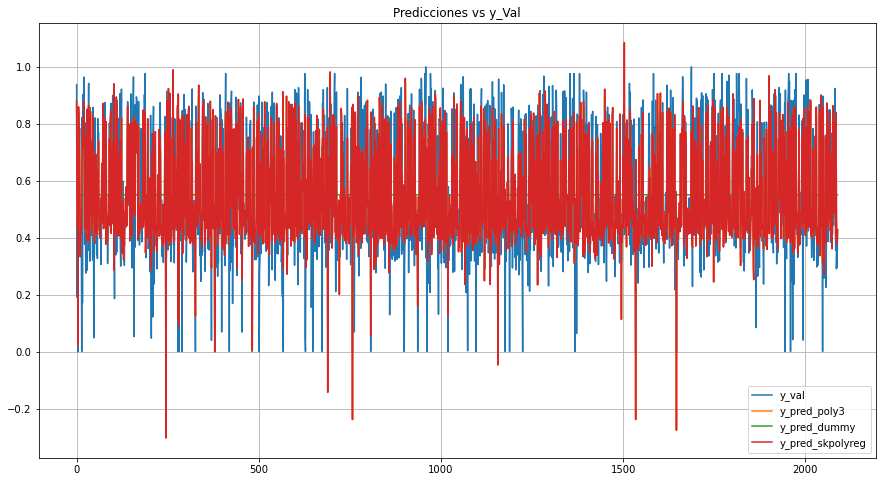

In [15]:
train_predict_models(X_train_RFE, y_train_RFE, X_val_RFE, y_val_RFE)

## SFS


poly3_model fit() called. 

El MSE obtenido con poly3 es: 0.021980955730832755
El MSE obtenido con dummy es: 0.04633437667751018
El R_2 obtenido con poly3 es: 0.5254684521383911
El R_2 obtenido con SK_poly3 es: 0.5254684521383911


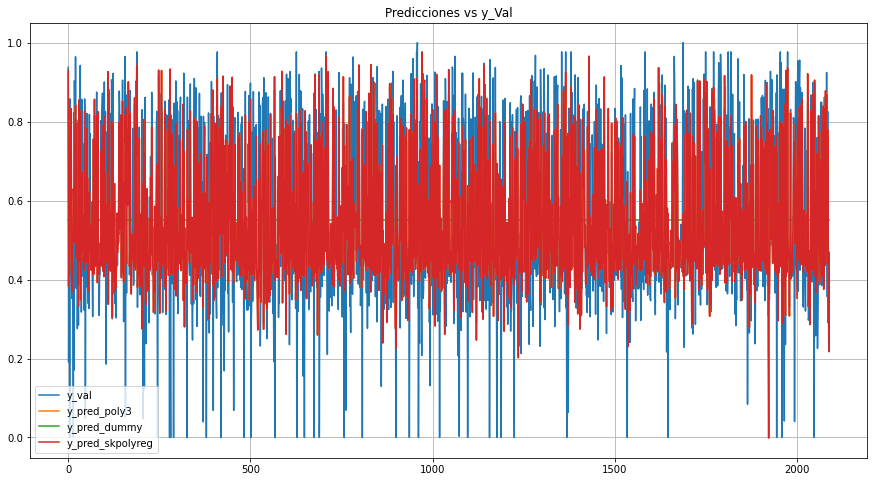

In [16]:
train_predict_models(X_train_SFS, y_train_SFS, X_val_SFS, y_val_SFS)


poly3_model fit() called. 

El MSE obtenido con poly3 es: 0.01708773306533529
El MSE obtenido con dummy es: 0.04633437667751018
El R_2 obtenido con poly3 es: 0.631104829096876
El R_2 obtenido con SK_poly3 es: 0.631104829096876


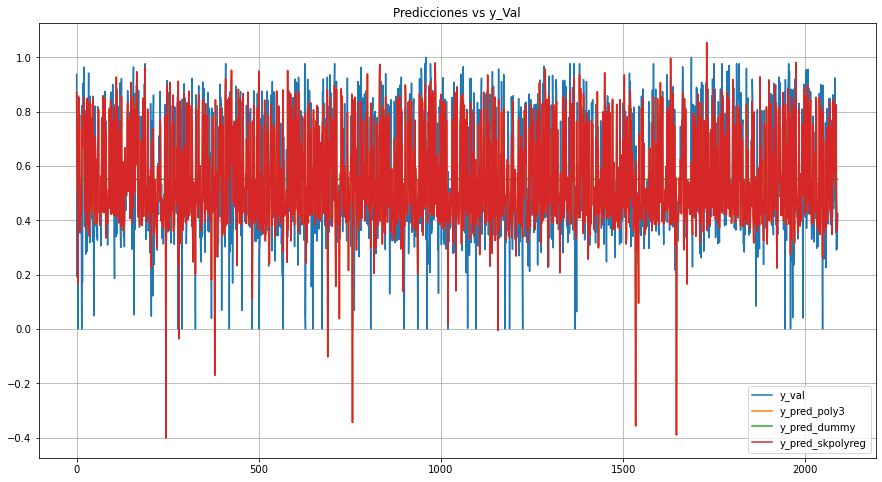

In [17]:
train_predict_models(X_train_MIX, y_train_MIX, X_val_MIX, y_val_MIX)

# Usando XGBOOST

In [11]:
import xgboost as xgb

# importo paquetes para optimización de hiperparámetros
# conda install -c conda-forge hyperopt
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# RFE

In [60]:
# Inicialización del espacio de dominio de rango de variables
space = {'boosting_type': hp.choice('boosting_type', ['gbdt', 'dart']),
        
        'max_depth': hp.quniform("max_depth", 3, 15, 1),
        'num_leaves': hp.quniform('num_leaves', 5, 50, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 0,5,1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.7,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform('n_estimators', 100, 1000, 100),
        'seed': 0
    }

In [61]:
def objective(space):
    reg = xgb.XGBRegressor(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( X_train_RFE, y_train_RFE), ( X_val_RFE, y_val_RFE)]
    
    reg.fit(X_train_RFE, y_train_RFE,
            eval_set = evaluation, eval_metric = "rmse",
            early_stopping_rounds = 10, verbose=False)
    
    pred = reg.predict(X_val_RFE)
    mse = mean_squared_error(y_val_RFE, pred)
    print ("SCORE:", mse)
    return {'loss': -mse, 'status': STATUS_OK }
    

In [62]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

job exception: 'float' object cannot be interpreted as an integer



  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]


TypeError: 'float' object cannot be interpreted as an integer

In [44]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.8699096651852745, 'gamma': 8.563687773652036, 'max_depth': 7.0, 'min_child_weight': 9.0, 'reg_alpha': 10.0, 'reg_lambda': 4.965411069750042}


In [51]:
XGB_regressor = xgb.XGBRegressor(booster = 'dart',
                    n_estimators =space['n_estimators'], max_depth = int(best_hyperparams['max_depth']), gamma = best_hyperparams['gamma'], min_child_weight=int(best_hyperparams['min_child_weight']),
                    colsample_bytree=int(best_hyperparams['colsample_bytree']), reg_lambda = best_hyperparams['reg_lambda'], reg_alpha = 0.5)

In [52]:
XGB_regressor.fit(X_train_RFE, y_train_RFE)
y_pred_XGB = XGB_regressor.predict(X_test_RFE)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
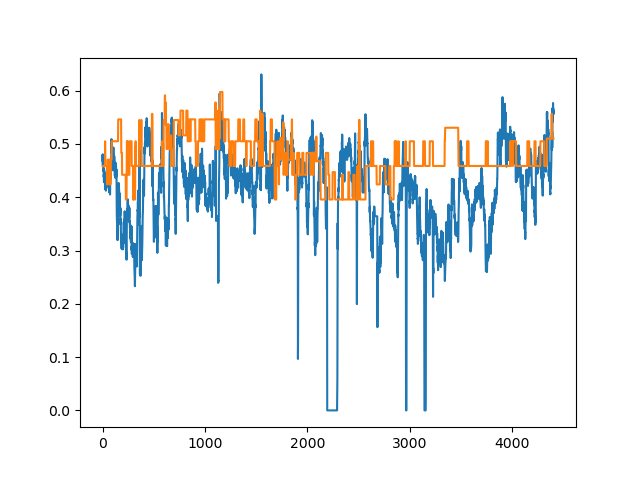

In [53]:
%matplotlib widget
plt.plot(np.arange(0, len(y_test_RFE)),y_test_RFE)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)

# AJUSTE DE HP UTILIZANDO GridSearch

In [8]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

In [9]:
def get_scores(y_predicted, y):
    from sklearn.metrics import r2_score, mean_squared_error
    score_r2 = r2_score(y_true = y, y_pred = y_predicted)
    score_mse = mean_squared_error(y_true = y, y_pred = y_predicted)
    print('R2 = ' + str(score_r2) + ' | MSE = ' + str(score_mse))


In [12]:
xgbr = xgb.XGBRegressor(seed = 20)

In [84]:
params = { 'max_depth': [3,6,8],
           'learning_rate': [0.01, 0.05, 0.1],
           'n_estimators': [100, 500, 1000, 2000],
           'colsample_bytree': [0.3, 0.7, 1.0],
           'min_child_weight': [0.5, 1, 2, 5], 
           'gamma': [0, 1, 2, 5]}

clf = GridSearchCV(estimator=xgbr, 
                   param_grid=params,
                   scoring='r2', 
                   verbose=1)

In [85]:
clf.fit(X_val_RFE, y_val_RFE)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", clf.best_score_)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best parameters: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 2000}
Lowest RMSE:  0.8432995534625363


In [68]:
XGB_regressor = xgb.XGBRegressor(colsample_bytree = 0.7, learning_rate = 0.1, max_depth = 6, n_estimators = 1000)
XGB_regressor.fit(X_train_RFE, y_train_RFE)


R2 = -0.4288109263655493 | MSE = 0.013173441378970216


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
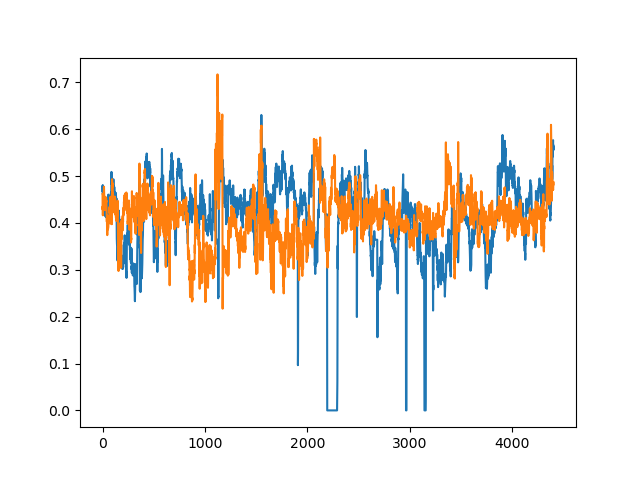

In [82]:
# colsample_bytree = 0.7, learning_rate = 0.1, max_depth = 6, n_estimators = 1000, score: 0.8368672386471276
y_pred_XGB = XGB_regressor.predict(X_test_RFE)
%matplotlib widget
plt.plot(np.arange(0, len(y_test_RFE)),y_test_RFE)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)
get_scores(y_pred_XGB, y_test_RFE)

In [102]:
XGB_regressor = xgb.XGBRegressor(colsample_bytree = 0.8, learning_rate = 0.1, max_depth = 6, n_estimators = 1000, min_child_weight = 0.05, gamma = 0.05)
XGB_regressor.fit(X_train_RFE, y_train_RFE)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, gamma=0.05, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=6,
             min_child_weight=0.05, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

R2 = -0.30666486116826586 | MSE = 0.012047271358951334


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
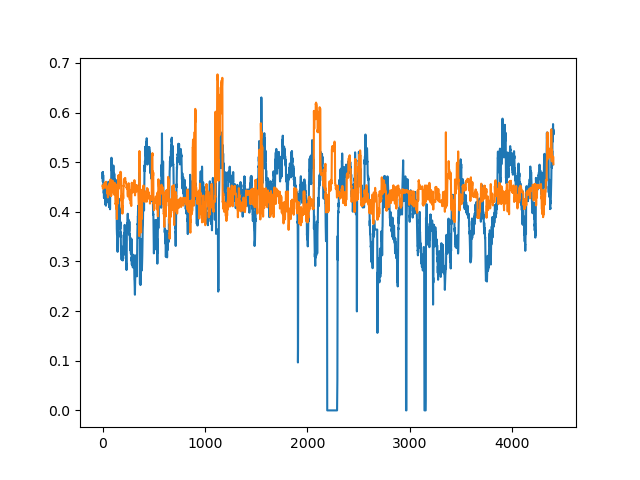

In [103]:
# colsample_bytree = 0.7, learning_rate = 0.1, max_depth = 6, n_estimators = 1000, score: 0.8368672386471276
y_pred_XGB = XGB_regressor.predict(X_test_RFE)
%matplotlib widget
plt.plot(np.arange(0, len(y_test_RFE)),y_test_RFE)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)
get_scores(y_pred_XGB, y_test_RFE)

R2 = -0.2573737333042916 | MSE = 0.011592813899649076


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
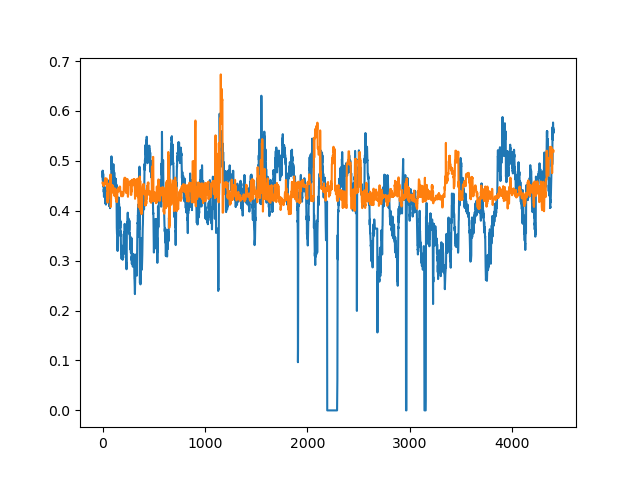

In [104]:
XGB_regressor = xgb.XGBRegressor(colsample_bytree = 0.8, learning_rate = 0.1, max_depth = 15, n_estimators = 25, min_child_weight = 1.5, gamma = 0.05, scale_pos_weight = 0)
XGB_regressor.fit(X_train_RFE, y_train_RFE)
y_pred_XGB = XGB_regressor.predict(X_test_RFE)
%matplotlib widget
plt.plot(np.arange(0, len(y_test_RFE)),y_test_RFE)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)
get_scores(y_pred_XGB, y_test_RFE)

# SFS

In [101]:
XGB_regressor = xgb.XGBRegressor(colsample_bytree = 0.8, learning_rate = 0.1, max_depth = 8, n_estimators = 25, min_child_weight = 1.5, gamma = 0.05)
XGB_regressor.fit(X_train_SFS, y_train_SFS)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, gamma=0.05, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=8,
             min_child_weight=1.5, missing=nan, monotone_constraints='()',
             n_estimators=25, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

R2 = -0.37666187768824466 | MSE = 0.01269263428053417


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
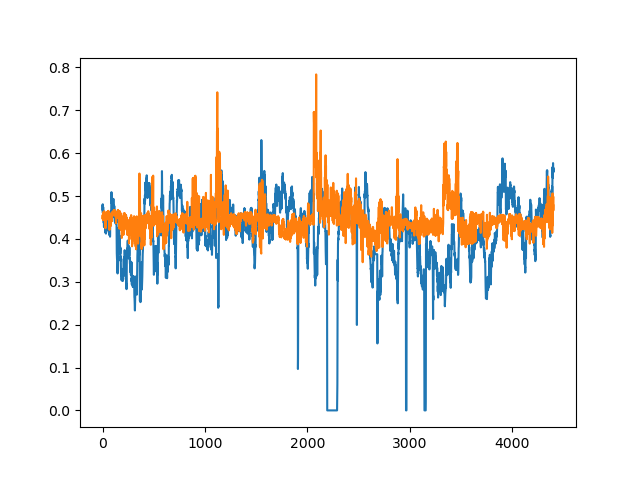

In [102]:
y_pred_XGB = XGB_regressor.predict(X_test_SFS)
%matplotlib widget
plt.plot(np.arange(0, len(y_test_SFS)),y_test_SFS)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)
get_scores(y_pred_XGB, y_test_SFS)

# MIX

In [59]:
XGB_regressor = xgb.XGBRegressor(colsample_bytree = 0.8, learning_rate = 0.1, max_depth = 15, n_estimators = 25, min_child_weight = 1.5, gamma = 0.05)
XGB_regressor.fit(X_train_MIX, y_train_MIX)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, gamma=0.05, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=15,
             min_child_weight=1.5, missing=nan, monotone_constraints='()',
             n_estimators=25, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

R2 = -0.23870728260352636 | MSE = 0.011420711776462306


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
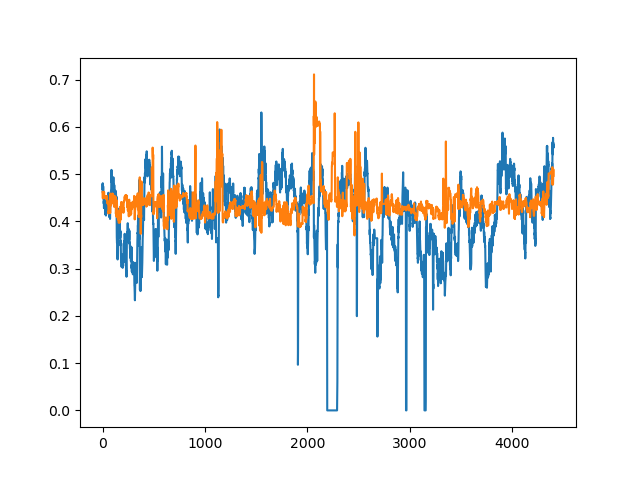

In [60]:
y_pred_XGB = XGB_regressor.predict(X_test_MIX)
%matplotlib widget
plt.plot(np.arange(0, len(y_test_MIX)),y_test_MIX)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)
get_scores(y_pred_XGB, y_test_MIX)

----------------------

In [ ]:
params_df = pd.DataFrame(columns = ['colsample_bytree', 'learning_rate', 'max_depth', 'n_estimators', 'reg_lambda', 'reg_alpha', 'gamma'])

---------------------------

In [26]:
poly3_model.fit(X_train_MIX, y_train_MIX)
y_pred_poly3 = poly3_model.predict(X_test_MIX)


poly3_model fit() called. 



In [31]:
%matplotlib widget

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …
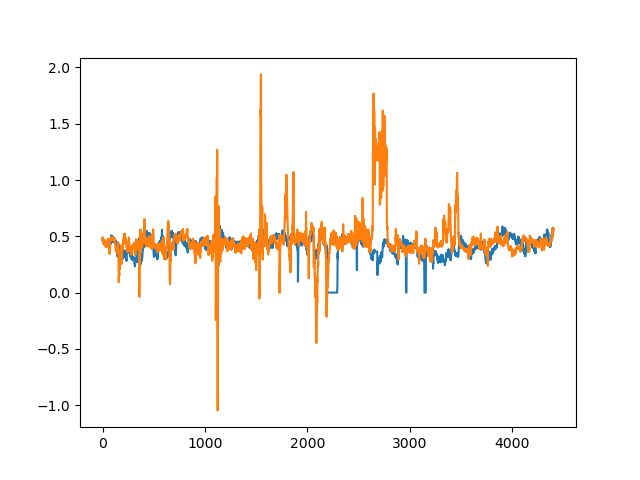

In [28]:
plt.plot(np.arange(0, len(y_test_RFE)),y_test_RFE)
plt.plot(np.arange(0, len(y_pred_poly3)),y_pred_poly3)


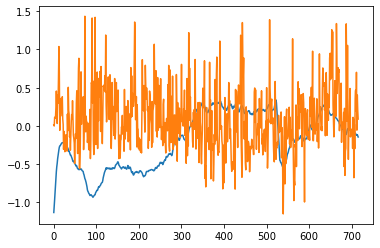

In [156]:
plt.plot(np.arange(0, len(y_test)),y_test)
plt.plot(np.arange(0, len(y_pred_XGB)),y_pred_XGB)

In [157]:
y_train_pred_XGB = XGB_regressor.predict(X_train)

In [160]:
X_train.shape

(2395, 35)

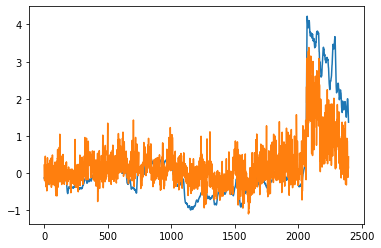

In [158]:
plt.plot(np.arange(0, len(y_train)),y_train)
plt.plot(np.arange(0, len(y_train_pred_XGB)),y_train_pred_XGB)